In [29]:
import rasterio
from rasterio.mask import mask
from rasterio.io import MemoryFile
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from rasterstats import zonal_stats, point_query
from shapely.geometry import box
from shapely.geometry import mapping

In [ ]:
/Users/lbeuster/Documents/SAL/Projects/throwing_shade/results/output/vegetation_shade_tests/dsm_bldg_test/vegbldgtest/dsm_blg_veg_day.tif


/Users/lbeuster/Documents/SAL/Projects/throwing_shade/data/clean_data

In [3]:
verhardingen = gpd.read_file('/Users/lbeuster/Documents/TU Delft/Projects/Land_Surface_Temperature/data/raw_data/AMS/verhardingen/Q1_20230126_ingekort.gpkg')

In [277]:
with rasterio.open('../data/clean_data/shade_comparison/buildings_only/shadow_fraction_on_20240703.tif') as src:
    data = src.read(1)
    data_meta = src.meta.copy()
    data_crs = src.crs
    affine = src.transform
    # Get the bounding box
    bbox = src.bounds
    x_min, y_min, x_max, y_max = bbox.left, bbox.bottom, bbox.right, bbox.top

# Create a bounding box geometry
bbox_geom = box(x_min, y_min, x_max, y_max)

# Create a GeoDataFrame with the bounding box
bbox_gdf = gpd.GeoDataFrame({'geometry': bbox_geom}, index=[0], crs=src.crs)

verhardingen = gpd.read_file('/Users/lbeuster/Documents/TU Delft/Projects/Land_Surface_Temperature/data/raw_data/AMS/verhardingen/Q1_20230126_ingekort.gpkg', mask=bbox_gdf).to_crs(data_crs)

# Handle invalid/faulty geometries:
verhardingen.geometry = verhardingen.geometry.buffer(0)

verhardingen = gpd.clip(verhardingen, bbox_gdf)


In [25]:
verhardingen.explore()

In [23]:
verhardingen.head()

24     POLYGON ((627491.626 5804746.789, 627495.369 5...
25     POLYGON ((627502.857 5804740.172, 627503.685 5...
23     POLYGON ((627494.579 5804743.359, 627494.692 5...
240    POLYGON ((627511.920 5804744.432, 627512.004 5...
266    POLYGON ((627495.151 5804750.079, 627495.062 5...
dtype: geometry

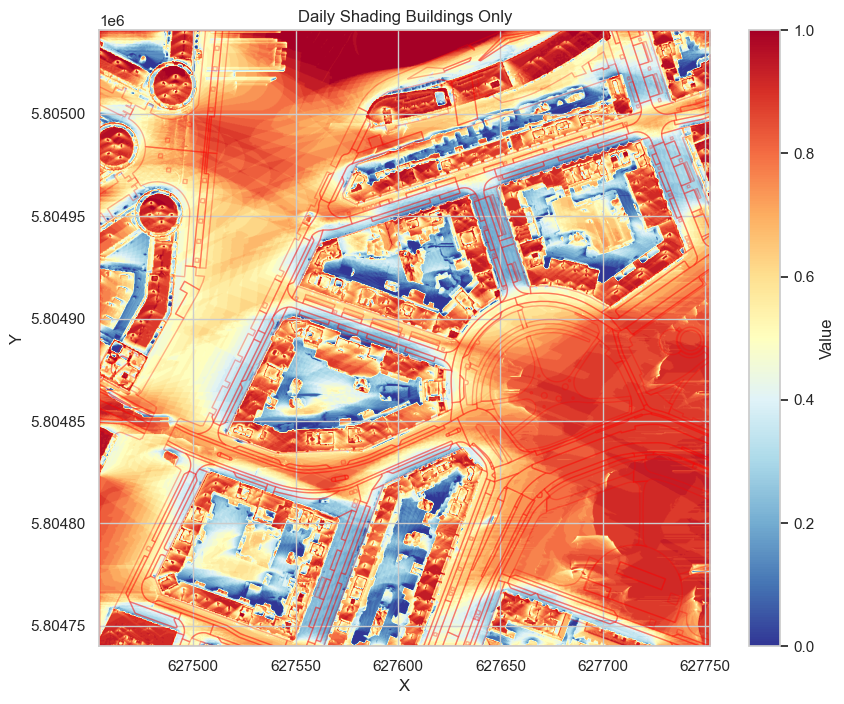

In [279]:
# Plot the combined raster
plt.figure(figsize=(10, 8))
plt.imshow(data, cmap='RdYlBu_r', extent=[x_min, x_max, y_min, y_max])
plt.title('Daily Shading Buildings Only')
plt.colorbar(label='Value')
plt.xlabel('X')
plt.ylabel('Y')

# Plot the GeoDataFrame
verhardingen.plot(ax=plt.gca(), edgecolor='red', facecolor='none', alpha=0.3)
bbox_gdf.plot(ax=plt.gca(), edgecolor='red', facecolor='none')

plt.show()

In [143]:
# Add an index column to the GeoDataFrame
verhardingen['index'] = verhardingen.index

# Convert GeoDataFrame to GeoJSON format
gdf_json = verhardingen.to_json()
print(gdf_json)


# Compute statistics using zonal_stats with already loaded data
stats = zonal_stats(gdf_json, data, affine=affine, nodata=src.nodata, stats=["mean", "median", "sum", "min", "max", "percentile_90"], geojson_out=True)
print(stats)

# Convert stats to a DataFrame
stats_df = pd.DataFrame([feature['properties'] for feature in stats])
print(stats_df.head())

# Merge the statistics back to the GeoDataFrame using the index
bldg_stats = verhardingen.merge(stats_df, left_on='index', right_on='index')

# Drop columns with _y suffix
bldg_stats = bldg_stats.drop(columns=[col for col in bldg_stats.columns if col.endswith('_y')])

# Rename columns with _x suffix
bldg_stats.columns = [col.replace('_x', '') for col in bldg_stats.columns]

# For binary raster data, compute the percentage covered by 1s
bldg_stats['area'] = bldg_stats['geometry'].area  # Compute the area of each polygon
bldg_stats['coverage'] = bldg_stats['sum'] / bldg_stats['area']  # Calculate coverage percentage

# Inspect the result
bldg_stats.head()

{"type": "FeatureCollection", "features": [{"id": "24", "type": "Feature", "properties": {"Guid": "{7A38E540-E4EF-4F34-9626-6798A88AB4D1}", "Objecttype": "Verhardingsobject", "Type": "Elementenverharding", "Type_gedetailleerd": "Straatbaksteen", "Type_extra_gedetailleerd": "Gebakken steen", "Kleur": "Rood", "Type_rijstrook": null, "Gebruiksfunctie": "Voetpad", "Wegtype_bestaand": "6 - Weg in verblijfsgebied", "Jaar_uitgevoerd_onderhoud": null, "Jaar_laatste_conservering": null, "Jaar_van_aanleg": 2022, "Oppervlakte_GIS": 315.933717500007, "Beheerder_gedetailleerd": "R&E_VOR_Verhardingen", "Onderhoudsplichtige": null, "index": 24}, "geometry": {"type": "Polygon", "coordinates": [[[627491.6260804919, 5804746.788694077], [627495.3694157166, 5804745.492637664], [627494.6915047743, 5804743.662501786], [627494.5794804714, 5804743.35867801], [627493.3245482394, 5804740.0], [627489.0988610081, 5804740.0], [627491.6260804919, 5804746.788694077]]]}}, {"id": "25", "type": "Feature", "properties":

,Guid,Objecttype,Type,Type_gedetailleerd,Type_extra_gedetailleerd,Kleur,Type_rijstrook,Gebruiksfunctie,Wegtype_bestaand,Jaar_uitgevoerd_onderhoud,...,index,id,min,max,mean,sum,median,percentile_90,area,coverage
0,{7A38E540-E4EF-4F34-9626-6798A88AB4D1},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,24,24,0.264706,0.941176,0.487181,201.205872,0.411765,0.882353,25.960918,7.750337
1,{ACA417E9-4754-44B3-AFE4-69F8E8B33B6F},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,25,25,0.176471,0.647059,0.371475,27.117645,0.382353,0.470588,4.507676,6.015881
2,{997FAAC5-FD83-4273-A8A1-24BDE1464C75},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,...,23,23,0.441176,0.558824,0.502426,97.470596,0.500000,0.558824,12.109175,8.049318
3,{81D53B4E-3F89-4125-9749-B3B96D5BCEBA},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,2010.0,...,240,240,0.029412,0.823529,0.462460,451.823547,0.500000,0.558824,61.521164,7.344197
4,{D8F4AAFB-7496-4BD1-8ABC-D3B8ADBA5A15},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,...,266,266,0.411765,0.735294,0.575800,1137.205933,0.558824,0.676471,123.229429,9.228363


In [161]:
bldg_stats.explore(column="mean", cmap = 'RdYlBu_r', tiles="CartoDB positron")

In [43]:
with rasterio.open('../data/clean_data/shade_comparison/buildings_trees/veg_bldg_shade_day.tif') as src:
    bldtree = src.read(1)
    bldtree_meta = src.meta.copy()
    bldtree_crs = src.crs
    bldtree_affine = src.transform

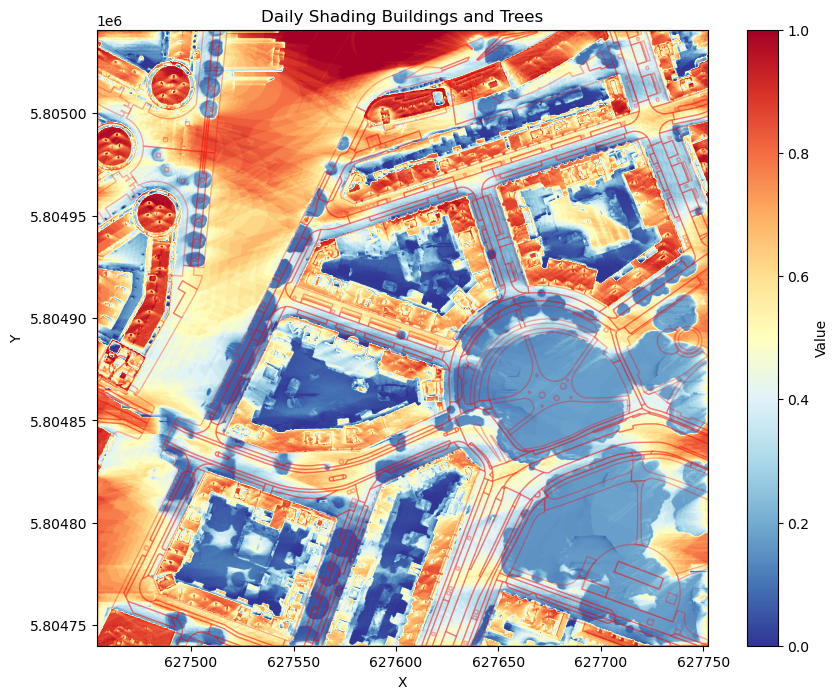

In [165]:
# Plot the combined raster
plt.figure(figsize=(10, 8))
plt.imshow(bldtree, cmap='RdYlBu_r', extent=[x_min, x_max, y_min, y_max])
plt.title('Daily Shading Buildings and Trees')
plt.colorbar(label='Value')
plt.xlabel('X')
plt.ylabel('Y')

# Plot the GeoDataFrame
verhardingen.plot(ax=plt.gca(), edgecolor='red', facecolor='none', alpha=0.3)
bbox_gdf.plot(ax=plt.gca(), edgecolor='red', facecolor='none')

plt.show()

In [144]:
# Add an index column to the GeoDataFrame, so we can merge it back correctly afterwards
verhardingen['index'] = verhardingen.index

# Convert GeoDataFrame to GeoJSON format
gdf_json = verhardingen.to_json()

# Compute statistics using zonal_stats with already loaded data
stats = zonal_stats(gdf_json, bldtree, affine=affine, nodata=src.nodata, stats=["mean", "median", "sum", "min", "max", "percentile_90"], geojson_out=True)

# Convert stats to a DataFrame
stats_df = pd.DataFrame([feature['properties'] for feature in stats])

# Merge the statistics back to the GeoDataFrame using the index
bldg_tree_stats = verhardingen.merge(stats_df, left_on='index', right_on='index')

# Drop columns with _y suffix
bldg_tree_stats = bldg_tree_stats.drop(columns=[col for col in bldg_tree_stats.columns if col.endswith('_y')])

# Rename columns with _x suffix
bldg_tree_stats.columns = [col.replace('_x', '') for col in bldg_tree_stats.columns]

### THIS IS STILL FUNKY, NEEDS MORE THOUGHT: 
# For binary raster data, compute the percentage covered by 1s - only relevant for hourly shade (1/0)
bldg_tree_stats['area'] = bldg_tree_stats['geometry'].area  # Compute the area of each polygon
bldg_tree_stats['coverage'] = bldg_tree_stats['sum'] / bldg_tree_stats['area']  # Calculate coverage percentage

bldg_tree_stats.rename(columns={"min": "min_tree", "max": "max_tree", "mean": "mean_tree", "sum": "sum_tree", "median": "median_tree", "percentile_90": "percentile_90_tree", "area": "area_tree", "coverage": "coverage_tree"}, inplace=True)

# Inspect the result
bldg_tree_stats.head()

,Guid,Objecttype,Type,Type_gedetailleerd,Type_extra_gedetailleerd,Kleur,Type_rijstrook,Gebruiksfunctie,Wegtype_bestaand,Jaar_uitgevoerd_onderhoud,...,index,id,min_tree,max_tree,mean_tree,sum_tree,median_tree,percentile_90_tree,area_tree,coverage_tree
0,{7A38E540-E4EF-4F34-9626-6798A88AB4D1},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,24,24,0.076471,0.894118,0.297750,122.970596,0.217647,0.858824,25.960918,4.736758
1,{ACA417E9-4754-44B3-AFE4-69F8E8B33B6F},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,25,25,0.129412,0.505882,0.238679,17.423531,0.194118,0.411765,4.507676,3.865302
2,{997FAAC5-FD83-4273-A8A1-24BDE1464C75},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,...,23,23,0.088235,0.535294,0.285082,55.305885,0.288235,0.511765,12.109175,4.567271
3,{81D53B4E-3F89-4125-9749-B3B96D5BCEBA},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,2010.0,...,240,240,0.005882,0.588235,0.147474,144.082367,0.117647,0.220000,61.521164,2.341997
4,{D8F4AAFB-7496-4BD1-8ABC-D3B8ADBA5A15},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,...,266,266,0.082353,0.735294,0.306612,605.558838,0.288235,0.580000,123.229429,4.914076


In [164]:
bldg_tree_stats.explore(column="mean_tree", cmap = 'RdYlBu_r', tiles="CartoDB positron")

## Difference daily shade

In [148]:
merged = pd.merge(bldg_stats, bldg_tree_stats, on="Guid", how="left")

# Drop columns with _y suffix
merged = merged.drop(columns=[col for col in merged.columns if col.endswith('_y')])

# Rename columns with _x suffix
merged.columns = [col.replace('_x', '') for col in merged.columns]

In [149]:
merged.head()

,Guid,Objecttype,Type,Type_gedetailleerd,Type_extra_gedetailleerd,Kleur,Type_rijstrook,Gebruiksfunctie,Wegtype_bestaand,Jaar_uitgevoerd_onderhoud,...,area,coverage,min_tree,max_tree,mean_tree,sum_tree,median_tree,percentile_90_tree,area_tree,coverage_tree
0,{7A38E540-E4EF-4F34-9626-6798A88AB4D1},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,25.960918,7.750337,0.076471,0.894118,0.297750,122.970596,0.217647,0.858824,25.960918,4.736758
1,{ACA417E9-4754-44B3-AFE4-69F8E8B33B6F},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,4.507676,6.015881,0.129412,0.505882,0.238679,17.423531,0.194118,0.411765,4.507676,3.865302
2,{997FAAC5-FD83-4273-A8A1-24BDE1464C75},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,...,12.109175,8.049318,0.088235,0.535294,0.285082,55.305885,0.288235,0.511765,12.109175,4.567271
3,{81D53B4E-3F89-4125-9749-B3B96D5BCEBA},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,2010.0,...,61.521164,7.344197,0.005882,0.588235,0.147474,144.082367,0.117647,0.220000,61.521164,2.341997
4,{D8F4AAFB-7496-4BD1-8ABC-D3B8ADBA5A15},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,...,123.229429,9.228363,0.082353,0.735294,0.306612,605.558838,0.288235,0.580000,123.229429,4.914076


## Difference between building and tree shade:

Interpretation: With trees, the daily shade % of surfaces increases by x %. 

Example: Surface a, which is in the shade for 12% of the day when considering buildings only, is in the shade 85% of the time when trees are taken into consideration. The difference is what is shown below (e.g., 0.63 (63%))

In [270]:
merged['difference'] = merged['mean'] - merged['mean_tree']
merged.explore(column='difference', cmap='YlGnBu', tiles="CartoDB positron")

In [166]:
merged.crs

<Projected CRS: EPSG:32631>
Name: WGS 84 / UTM zone 31N
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: UTM zone 31N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [170]:
merged = merged.to_crs(4326)
merged.to_file('../results/output/240705_daily_shade_on_verhardingen.json', driver='GeoJSON')

<Axes: >

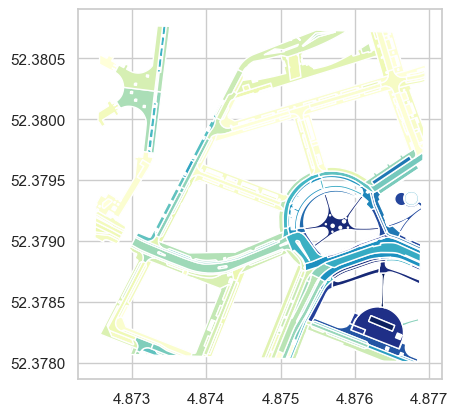

In [275]:
merged.plot(column='difference', cmap='YlGnBu' )

## Hourly shade

School hours:
- start: 8:30-9:00
- Lunch break: 11:45-12:30 ish
- end: 14:00-15:30

Most important shade time:

- 12:00

- 15:00 / 16:00;

Hypothesis: I'd assume that buildings play a bigger role in the afternoon


In [267]:
with rasterio.open('../data/clean_data/shade_comparison/buildings_only/Shadow_20240703_1300_LST.tif') as src:
    lunchbld = src.read(1)
    lunchbld_meta = src.meta.copy()
    lunchbld_crs = src.crs
    lunchbld_affine = src.transform

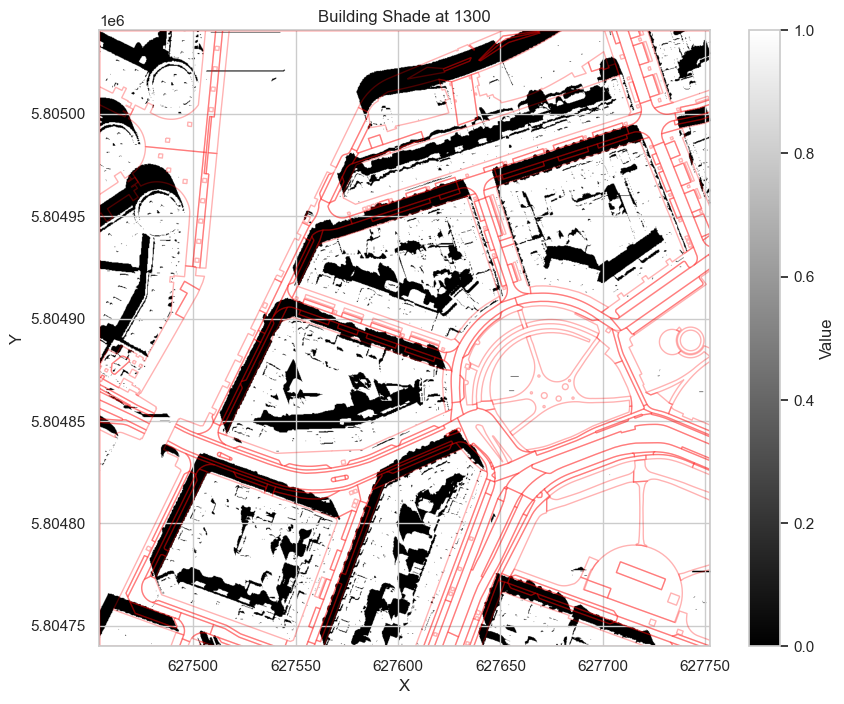

In [268]:
# Plot the combined raster
plt.figure(figsize=(10, 8))
plt.imshow(lunchbld, cmap='gray', extent=[x_min, x_max, y_min, y_max])
plt.title('Building Shade at 1300')
plt.colorbar(label='Value')
plt.xlabel('X')
plt.ylabel('Y')

# Plot the GeoDataFrame
verhardingen.plot(ax=plt.gca(), edgecolor='red', facecolor='none', alpha=0.3)
bbox_gdf.plot(ax=plt.gca(), edgecolor='red', facecolor='none')

plt.show()

In [172]:
with rasterio.open('../data/clean_data/shade_comparison/buildings_trees/Shadow_20240703_1200_LST.tif') as src:
    lunchbldtree = src.read(1)
    lunchbldtree_meta = src.meta.copy()
    lunchbldtree_crs = src.crs
    lunchbldtree_affine = src.transform

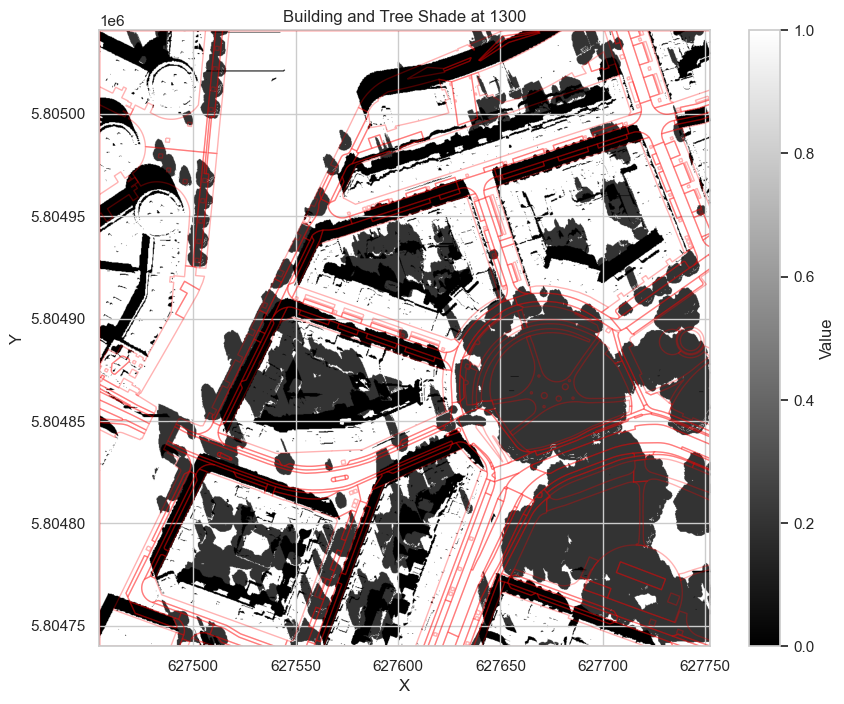

In [269]:
with rasterio.open('../data/clean_data/shade_comparison/buildings_trees/Shadow_20240703_1300_LST.tif') as src:
    lunchbldtree = src.read(1)
    lunchbldtree_meta = src.meta.copy()
    lunchbldtree_crs = src.crs
    lunchbldtree_affine = src.transform
    lunchbldtree_nodata = src.nodata
# Plot the raster
plt.figure(figsize=(10, 8))
plt.imshow(lunchbldtree, cmap='gray', extent=[x_min, x_max, y_min, y_max])
plt.title('Building and Tree Shade at 1300')
plt.colorbar(label='Value')
plt.xlabel('X')
plt.ylabel('Y')

# Plot the GGDF
verhardingen.plot(ax=plt.gca(), edgecolor='red', facecolor='none', alpha=0.3)
bbox_gdf.plot(ax=plt.gca(), edgecolor='red', facecolor='none')

plt.show()

Converting to absolute shade yes/no

In [209]:
# Set all values < 1.0 to 0
lunchbldtree[lunchbldtree < 1.0] = 0

# Invert the binary values: 0 becomes 1 and 1 becomes 0
lunchbldtree = np.where(lunchbldtree == 0, 1, 0)

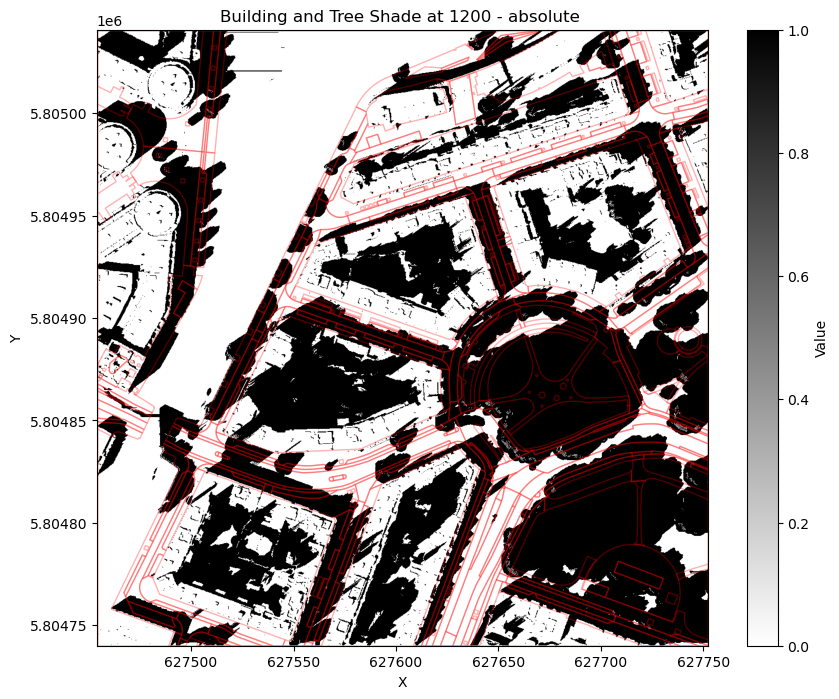

In [210]:
# Plot the raster
plt.figure(figsize=(10, 8))
plt.imshow(lunchbldtree, cmap='gray_r', extent=[x_min, x_max, y_min, y_max])
plt.title('Building and Tree Shade at 1200 - absolute ')
plt.colorbar(label='Value')
plt.xlabel('X')
plt.ylabel('Y')

# Plot the GGDF
verhardingen.plot(ax=plt.gca(), edgecolor='red', facecolor='none', alpha=0.3)
bbox_gdf.plot(ax=plt.gca(), edgecolor='red', facecolor='none')

plt.show()

In [127]:
# Add an index column to the GeoDataFrame
verhardingen['index'] = verhardingen.index

# Convert GeoDataFrame to GeoJSON format
gdf_json = verhardingen.to_json()

# Compute statistics using zonal_stats with already loaded data
stats = zonal_stats(gdf_json, lunchbldtree, affine=affine, nodata=src.nodata, stats=["mean", "median", "sum", "min", "max", "percentile_90"], geojson_out=True)

# Convert stats to a DataFrame
stats_df = pd.DataFrame([feature['properties'] for feature in stats])


# Merge the statistics back to the GeoDataFrame using the index
lunchbldtree_stats = verhardingen.merge(stats_df, left_on='index', right_on='index')

# For binary raster data, compute the percentage covered by 1s - only relevant for hourly shade (1/0)
lunchbldtree_stats['area'] = lunchbldtree_stats['geometry'].area  # Compute the area of each polygon
lunchbldtree_stats['coverage'] = lunchbldtree_stats['sum'] / (lunchbldtree_stats['area']/0.25)  # Calculate coverage percentage divided by resolution

lunchbldtree_stats.rename(columns={"min": "min_tree", "max": "max_tree", "mean": "mean_tree", "sum": "sum_tree", "median": "median_tree", "percentile_90": "percentile_90_tree", "area": "area_tree", "coverage": "coverage_tree"}, inplace=True)

# Inspect the result
lunchbldtree_stats.head()

,Guid_x,Objecttype_x,Type_x,Type_gedetailleerd_x,Type_extra_gedetailleerd_x,Kleur_x,Type_rijstrook_x,Gebruiksfunctie_x,Wegtype_bestaand_x,Jaar_uitgevoerd_onderhoud_x,...,Beheerder_gedetailleerd_y,Onderhoudsplichtige_y,min_tree,max_tree,mean_tree,sum_tree,median_tree,percentile_90_tree,area_tree,coverage_tree
0,{7A38E540-E4EF-4F34-9626-6798A88AB4D1},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,R&E_VOR_Verhardingen,None,0.0,1.0,0.646489,267.0,1.0,1.0,25.960918,2.571173
1,{ACA417E9-4754-44B3-AFE4-69F8E8B33B6F},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,R&E_VOR_Verhardingen,None,0.0,1.0,0.602740,44.0,1.0,1.0,4.507676,2.440282
2,{997FAAC5-FD83-4273-A8A1-24BDE1464C75},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,...,R&E_VOR_Verhardingen,None,0.0,1.0,0.340206,66.0,0.0,1.0,12.109175,1.362603
3,{81D53B4E-3F89-4125-9749-B3B96D5BCEBA},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,2010.0,...,R&E_VOR_Verhardingen,None,0.0,1.0,0.875128,855.0,1.0,1.0,61.521164,3.474414
4,{D8F4AAFB-7496-4BD1-8ABC-D3B8ADBA5A15},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,...,R&E_VOR_Verhardingen,None,0.0,1.0,0.581266,1148.0,1.0,1.0,123.229429,2.328989


In [134]:
lunchbldtree_stats.explore(column="coverage_tree", cmap = 'RdYlBu_r')

In [215]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
from shapely.geometry import mapping
import numpy as np

def calculate_percentage_covered(raster_path, shapefile):
    # Read the raster file
    with rasterio.open(raster_path) as src:
        raster_data = src.read(1)  # Read the first band
        raster_transform = src.transform

        # Set all values < 1.0 to 0
        raster_data[raster_data < 1.0] = 0

        # Invert the binary values: 0 becomes 1 and 1 becomes 0
        raster_data = np.where(raster_data == 0, 1, 0)

        # Read the shapefile
        gdf = shapefile.copy()

        # Loop over each polygon and calculate the percentage of coverage
        percentages = []
        for idx, row in gdf.iterrows():
            polygon = row['geometry']
            # Mask the raster with the current polygon
            out_image, out_transform = mask(src, [mapping(polygon)], crop=True)
            # Flatten the array and remove masked values
            masked_data = out_image[0].flatten()
            masked_data = masked_data[masked_data != src.nodata]
            # Calculate the percentage of 1s
            total_pixels = len(masked_data)
            if total_pixels > 0:
                percentage_ones = np.sum(masked_data == 1) / total_pixels * 100
            else:
                percentage_ones = 0
            percentages.append(percentage_ones)
        
        # Add the percentage coverage to the GeoDataFrame
        gdf['shade_percent'] = percentages


    return gdf

# Example usage
raster_path = '../data/clean_data/shade_comparison/buildings_trees/Shadow_20240703_1600_LST.tif'
# shapefile_path = 'path_to_your_shapefile.shp'
coverage_results = calculate_percentage_covered(raster_path, verhardingen)

coverage_results.head()

,Guid,Objecttype,Type,Type_gedetailleerd,Type_extra_gedetailleerd,Kleur,Type_rijstrook,Gebruiksfunctie,Wegtype_bestaand,Jaar_uitgevoerd_onderhoud,Jaar_laatste_conservering,Jaar_van_aanleg,Oppervlakte_GIS,Beheerder_gedetailleerd,Onderhoudsplichtige,geometry,index,shade_percent
24,{7A38E540-E4EF-4F34-9626-6798A88AB4D1},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,NaN,2022,315.933718,R&E_VOR_Verhardingen,None,"POLYGON ((627491.626 5804746.789, 627495.369 5...",24,23.486683
25,{ACA417E9-4754-44B3-AFE4-69F8E8B33B6F},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,NaN,2022,364.568236,R&E_VOR_Verhardingen,None,"POLYGON ((627502.857 5804740.172, 627503.685 5...",25,42.465753
23,{997FAAC5-FD83-4273-A8A1-24BDE1464C75},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,NaN,2022,146.614749,R&E_VOR_Verhardingen,None,"POLYGON ((627494.579 5804743.359, 627494.692 5...",23,35.051546
240,{81D53B4E-3F89-4125-9749-B3B96D5BCEBA},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,2010.0,NaN,1992,151.610000,R&E_VOR_Verhardingen,None,"POLYGON ((627511.920 5804744.432, 627512.004 5...",240,6.960082
266,{D8F4AAFB-7496-4BD1-8ABC-D3B8ADBA5A15},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,NaN,2022,123.259589,R&E_VOR_Verhardingen,None,"POLYGON ((627495.151 5804750.079, 627495.062 5...",266,35.746835


In [257]:


def calculate_percentage_covered(raster_path, shapefile):
    # Read the raster file
    with rasterio.open(raster_path) as src:
        raster_data = src.read(1)  # Read the first band
        raster_meta = src.meta

    # Set all values < 1.0 to 0
    raster_data[raster_data < 1.0] = 0

    # Invert the binary values: 0 becomes 1 and 1 becomes 0
    inverted_raster_data = np.where(raster_data == 0, 1, 0)

    # Create an in-memory file for the modified raster data
    with MemoryFile() as memfile:
        with memfile.open(**raster_meta) as mem:
            mem.write(inverted_raster_data, 1)

            # Read the shapefile
            gdf = shapefile.copy()

            # Loop over each polygon and calculate the percentage of coverage
            percentages = []
            for idx, row in gdf.iterrows():
                polygon = row['geometry']
                # Mask the raster with the current polygon using the in-memory file
                out_image, out_transform = mask(mem, [mapping(polygon)], crop=True)
                # Flatten the array and remove masked values
                masked_data = out_image[0].flatten()
                masked_data = masked_data[masked_data != mem.nodata]
                # Calculate the percentage of 1s
                total_pixels = len(masked_data)
                if total_pixels > 0:
                    percentage_ones = np.sum(masked_data == 1) / total_pixels * 100
                else:
                    percentage_ones = 0
                percentages.append(percentage_ones)
            
            # Add the percentage coverage to the GeoDataFrame
            gdf['shade_percent'] = percentages

    return gdf

# Example usage
raster_path = '../data/clean_data/shade_comparison/buildings_trees/Shadow_20240703_1300_LST.tif'
# Assume verhardingen is a GeoDataFrame loaded earlier
# verhardingen = gpd.read_file('path_to_your_shapefile.shp')
coverage_results = calculate_percentage_covered(raster_path, verhardingen)

# Print results
coverage_results.head()

,Guid,Objecttype,Type,Type_gedetailleerd,Type_extra_gedetailleerd,Kleur,Type_rijstrook,Gebruiksfunctie,Wegtype_bestaand,Jaar_uitgevoerd_onderhoud,Jaar_laatste_conservering,Jaar_van_aanleg,Oppervlakte_GIS,Beheerder_gedetailleerd,Onderhoudsplichtige,geometry,index,shade_percent
24,{7A38E540-E4EF-4F34-9626-6798A88AB4D1},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,NaN,2022,315.933718,R&E_VOR_Verhardingen,None,"POLYGON ((627491.626 5804746.789, 627495.369 5...",24,49.152542
25,{ACA417E9-4754-44B3-AFE4-69F8E8B33B6F},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,NaN,2022,364.568236,R&E_VOR_Verhardingen,None,"POLYGON ((627502.857 5804740.172, 627503.685 5...",25,35.616438
23,{997FAAC5-FD83-4273-A8A1-24BDE1464C75},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,NaN,2022,146.614749,R&E_VOR_Verhardingen,None,"POLYGON ((627494.579 5804743.359, 627494.692 5...",23,32.989691
240,{81D53B4E-3F89-4125-9749-B3B96D5BCEBA},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,2010.0,NaN,1992,151.610000,R&E_VOR_Verhardingen,None,"POLYGON ((627511.920 5804744.432, 627512.004 5...",240,82.190379
266,{D8F4AAFB-7496-4BD1-8ABC-D3B8ADBA5A15},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,NaN,2022,123.259589,R&E_VOR_Verhardingen,None,"POLYGON ((627495.151 5804750.079, 627495.062 5...",266,61.569620


In [258]:
coverage_results.dtypes

Guid                           object
Objecttype                     object
Type                           object
Type_gedetailleerd             object
Type_extra_gedetailleerd       object
Kleur                          object
Type_rijstrook                 object
Gebruiksfunctie                object
Wegtype_bestaand               object
Jaar_uitgevoerd_onderhoud     float64
Jaar_laatste_conservering     float64
Jaar_van_aanleg                 int64
Oppervlakte_GIS               float64
Beheerder_gedetailleerd        object
Onderhoudsplichtige            object
geometry                     geometry
index                           int64
shade_percent                 float64
dtype: object

In [261]:
coverage_results.explore(column='shade_percent', cmap='RdYlBu')

In [262]:
import seaborn as sns

                   count       mean        std        min        25%  \
Gebruiksfunctie                                                        
Berm                 5.0  58.247568  26.350015  26.286765  51.166966   
Fietspad            11.0  72.417841  29.037921  21.885522  43.995030   
Halte eiland        24.0  37.104944  40.958272   0.000000   0.000000   
Haltekom OV          1.0  93.641618        NaN  93.641618  93.641618   
Inrit                3.0  79.408956  22.209860  55.873926  69.113433   
OV-baan              3.0   1.121241   1.755477   0.000000   0.109697   
Parkeervak          77.0  58.667987  38.999668   0.000000  20.139292   
Rijbaan             44.0  46.765612  34.371411   0.000000   9.058161   
Speelondergrond      2.0  60.676244  45.838772  28.263337  44.469790   
Trambaan             1.0  35.847716        NaN  35.847716  35.847716   
Voetgangersgebied    6.0  64.426172  25.816842  20.291971  60.746211   
Voetpad             86.0  61.767784  31.878557   0.000000  42.46

/var/folders/qg/ghhvk02j7t3f3b9th5d2412rxxy23f/T/ipykernel_13781/2463558748.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Gebruiksfunctie', y='shade_percent', data=df, palette='tab10')


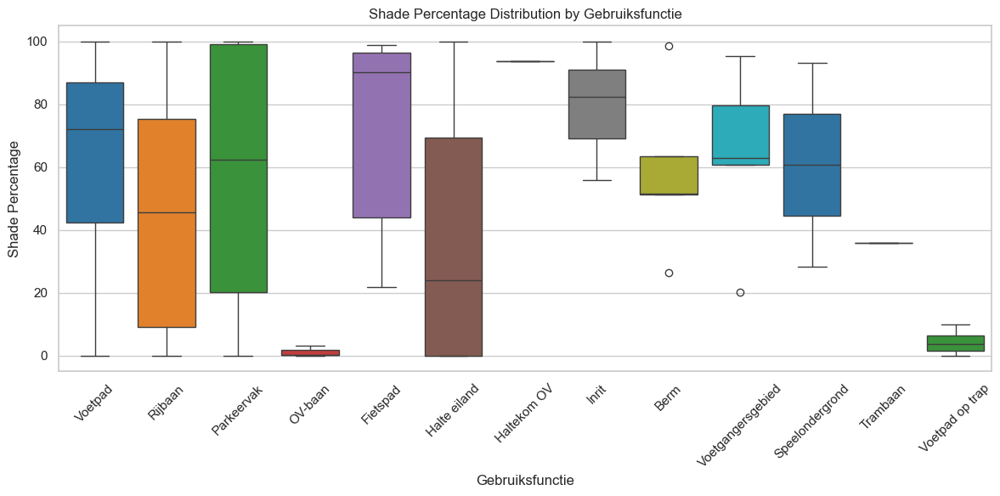

/var/folders/qg/ghhvk02j7t3f3b9th5d2412rxxy23f/T/ipykernel_13781/2463558748.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Gebruiksfunctie', y='shade_percent', data=mean_shade, palette='Greens')


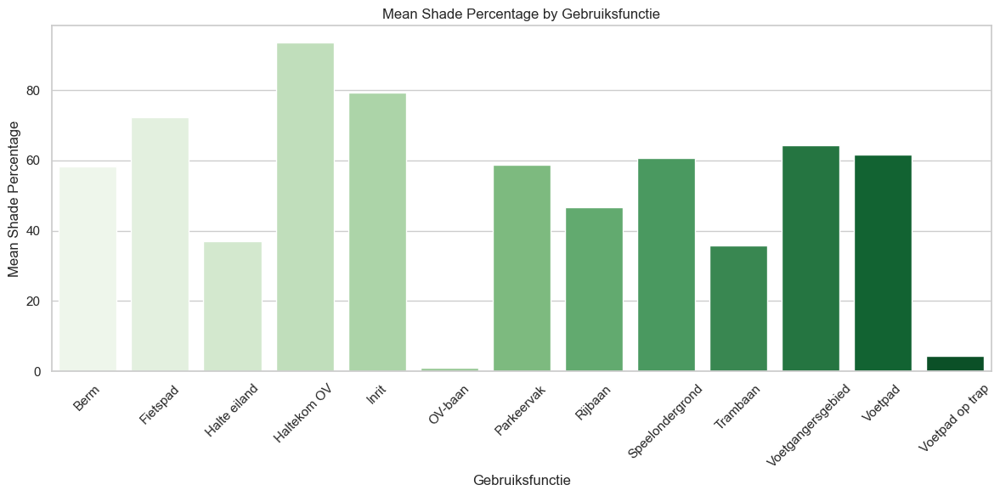

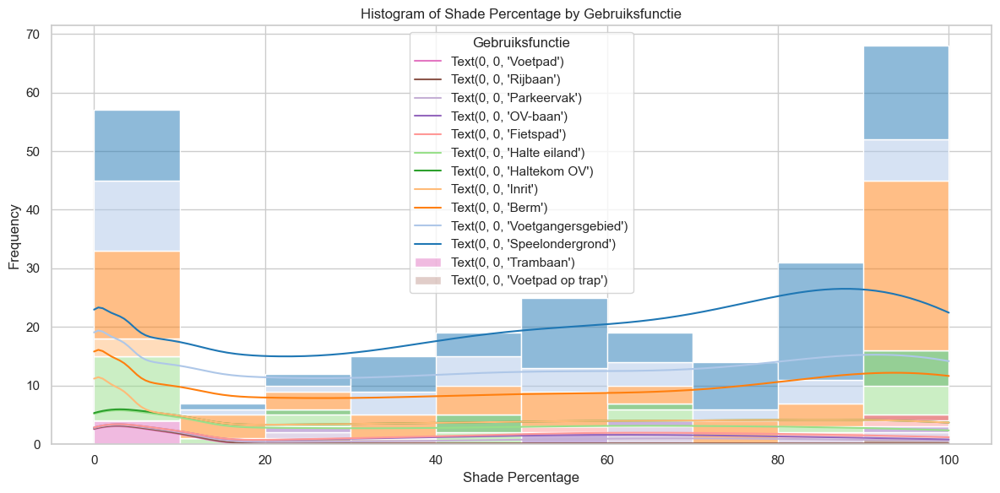

In [230]:
# Convert GeoDataFrame to DataFrame for easier manipulation
df = pd.DataFrame(coverage_results)

# Group by 'Gebruiksfunctie' and calculate summary statistics for 'shade_percent'
summary_stats = df.groupby('Gebruiksfunctie')['shade_percent'].describe()

# Print summary statistics
print(summary_stats)

# Set up the visualizations
sns.set(style="whitegrid")

# Box plot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Gebruiksfunctie', y='shade_percent', data=df, palette='tab10')
plt.title('Shade Percentage Distribution by Gebruiksfunctie')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Shade Percentage')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Bar plot of mean shade percentage
mean_shade = df.groupby('Gebruiksfunctie')['shade_percent'].mean().reset_index()
plt.figure(figsize=(12, 6))
sns.barplot(x='Gebruiksfunctie', y='shade_percent', data=mean_shade, palette='Greens')
plt.title('Mean Shade Percentage by Gebruiksfunctie')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Mean Shade Percentage')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Histogram of shade percentage with legend labels
plt.figure(figsize=(12, 6))
hist_plot = sns.histplot(data=df, x='shade_percent', hue='Gebruiksfunctie', multiple="stack", palette="tab20", kde=True)
plt.title('Histogram of Shade Percentage by Gebruiksfunctie')
plt.xlabel('Shade Percentage')
plt.ylabel('Frequency')
plt.legend(title='Gebruiksfunctie', labels=hist_plot.get_legend().get_texts())
plt.tight_layout()
plt.show()

/var/folders/qg/ghhvk02j7t3f3b9th5d2412rxxy23f/T/ipykernel_13781/671264723.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('Blues')


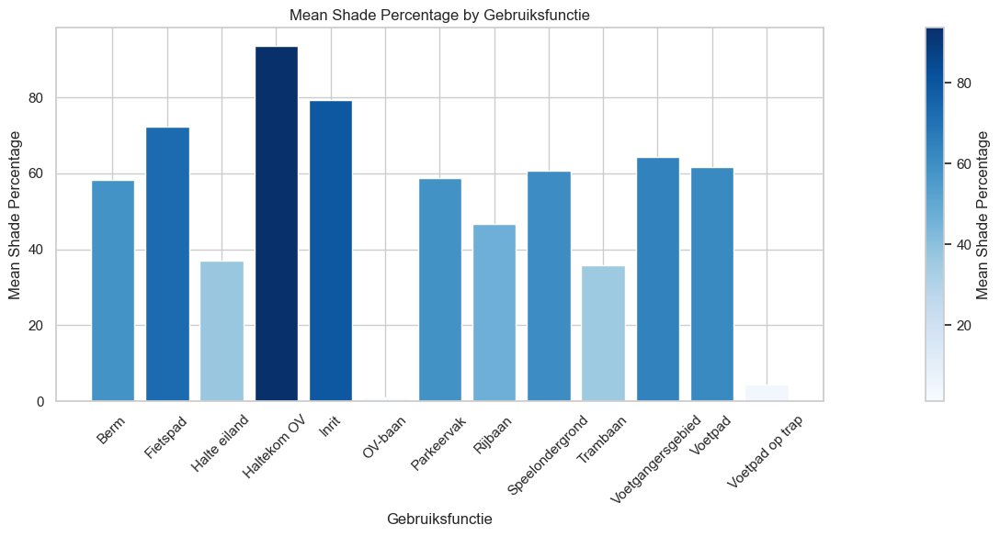

In [236]:
# Group by 'Gebruiksfunctie' and calculate mean shade percentage
mean_shade = df.groupby('Gebruiksfunctie')['shade_percent'].mean().reset_index()

# Set up the visualizations
plt.figure(figsize=(12, 6))

# Define a colormap (e.g., 'Greens') and normalize shade_percent to [0, 1]
colormap = plt.cm.get_cmap('Blues')
normalize = plt.Normalize(vmin=mean_shade['shade_percent'].min(), vmax=mean_shade['shade_percent'].max())

# Plot each bar with a color mapped to its shade_percent value
bars = plt.bar(mean_shade['Gebruiksfunctie'], mean_shade['shade_percent'], 
               color=colormap(normalize(mean_shade['shade_percent'])))

# Add color bar for reference
sm = plt.cm.ScalarMappable(cmap=colormap, norm=normalize)
sm.set_array([])  # Empty array required for the colorbar to work
cbar = plt.colorbar(sm, ax=plt.gca(), pad=0.1)
cbar.set_label('Mean Shade Percentage')

# Add labels and title
plt.title('Mean Shade Percentage by Gebruiksfunctie')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Mean Shade Percentage')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

/var/folders/qg/ghhvk02j7t3f3b9th5d2412rxxy23f/T/ipykernel_13781/1750875475.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('Blues')


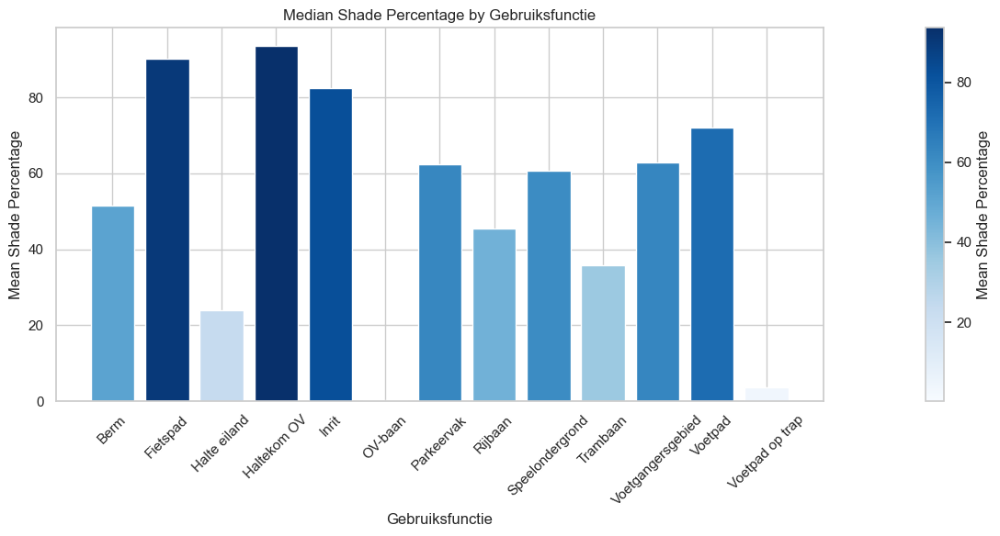

In [238]:
# Group by 'Gebruiksfunctie' and calculate mean shade percentage
median_shade = df.groupby('Gebruiksfunctie')['shade_percent'].median().reset_index()

# Set up the visualizations
plt.figure(figsize=(12, 6))

# Define a colormap (e.g., 'Greens') and normalize shade_percent to [0, 1]
colormap = plt.cm.get_cmap('Blues')
normalize = plt.Normalize(vmin=median_shade['shade_percent'].min(), vmax=median_shade['shade_percent'].max())

# Plot each bar with a color mapped to its shade_percent value
bars = plt.bar(median_shade['Gebruiksfunctie'], median_shade['shade_percent'], 
               color=colormap(normalize(median_shade['shade_percent'])))

# Add color bar for reference
sm = plt.cm.ScalarMappable(cmap=colormap, norm=normalize)
sm.set_array([])  # Empty array required for the colorbar to work
cbar = plt.colorbar(sm, ax=plt.gca(), pad=0.1)
cbar.set_label('Mean Shade Percentage')

# Add labels and title
plt.title('Median Shade Percentage by Gebruiksfunctie')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Mean Shade Percentage')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [263]:


def calculate_percentage_covered(raster_path, shapefile):
    # Read the raster file
    with rasterio.open(raster_path) as src:
        raster_data = src.read(1)  # Read the first band
        raster_meta = src.meta

    # Set all values < 1.0 to 0
    raster_data[raster_data < 1.0] = 0

    # Invert the binary values: 0 becomes 1 and 1 becomes 0
    inverted_raster_data = np.where(raster_data == 0, 1, 0)

    # Create an in-memory file for the modified raster data
    with MemoryFile() as memfile:
        with memfile.open(**raster_meta) as mem:
            mem.write(inverted_raster_data, 1)

            # Read the shapefile
            gdf = shapefile.copy()

            # Loop over each polygon and calculate the percentage of coverage
            percentages = []
            for idx, row in gdf.iterrows():
                polygon = row['geometry']
                # Mask the raster with the current polygon using the in-memory file
                out_image, out_transform = mask(mem, [mapping(polygon)], crop=True)
                # Flatten the array and remove masked values
                masked_data = out_image[0].flatten()
                masked_data = masked_data[masked_data != mem.nodata]
                # Calculate the percentage of 1s
                total_pixels = len(masked_data)
                if total_pixels > 0:
                    percentage_ones = np.sum(masked_data == 1) / total_pixels * 100
                else:
                    percentage_ones = 0
                percentages.append(percentage_ones)
            
            # Add the percentage coverage to the GeoDataFrame
            gdf['shade_percent'] = percentages

    return gdf

# Example usage
raster_path = '../data/clean_data/shade_comparison/buildings_only/Shadow_20240703_1300_LST.tif'
# Assume verhardingen is a GeoDataFrame loaded earlier
# verhardingen = gpd.read_file('path_to_your_shapefile.shp')
coverage_results_buildings_only = calculate_percentage_covered(raster_path, verhardingen)

# Print results
coverage_results_buildings_only.head()

,Guid,Objecttype,Type,Type_gedetailleerd,Type_extra_gedetailleerd,Kleur,Type_rijstrook,Gebruiksfunctie,Wegtype_bestaand,Jaar_uitgevoerd_onderhoud,Jaar_laatste_conservering,Jaar_van_aanleg,Oppervlakte_GIS,Beheerder_gedetailleerd,Onderhoudsplichtige,geometry,index,shade_percent
24,{7A38E540-E4EF-4F34-9626-6798A88AB4D1},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,NaN,2022,315.933718,R&E_VOR_Verhardingen,None,"POLYGON ((627491.626 5804746.789, 627495.369 5...",24,0.000000
25,{ACA417E9-4754-44B3-AFE4-69F8E8B33B6F},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,NaN,2022,364.568236,R&E_VOR_Verhardingen,None,"POLYGON ((627502.857 5804740.172, 627503.685 5...",25,35.616438
23,{997FAAC5-FD83-4273-A8A1-24BDE1464C75},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,NaN,2022,146.614749,R&E_VOR_Verhardingen,None,"POLYGON ((627494.579 5804743.359, 627494.692 5...",23,0.000000
240,{81D53B4E-3F89-4125-9749-B3B96D5BCEBA},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,2010.0,NaN,1992,151.610000,R&E_VOR_Verhardingen,None,"POLYGON ((627511.920 5804744.432, 627512.004 5...",240,50.972364
266,{D8F4AAFB-7496-4BD1-8ABC-D3B8ADBA5A15},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,NaN,2022,123.259589,R&E_VOR_Verhardingen,None,"POLYGON ((627495.151 5804750.079, 627495.062 5...",266,1.518987


In [246]:
df_bldg.head()

,Guid,Objecttype,Type,Type_gedetailleerd,Type_extra_gedetailleerd,Kleur,Type_rijstrook,Gebruiksfunctie,Wegtype_bestaand,Jaar_uitgevoerd_onderhoud,Jaar_laatste_conservering,Jaar_van_aanleg,Oppervlakte_GIS,Beheerder_gedetailleerd,Onderhoudsplichtige,geometry,index,shade_percent_buildings
24,{7A38E540-E4EF-4F34-9626-6798A88AB4D1},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,NaN,2022,315.933718,R&E_VOR_Verhardingen,None,"POLYGON ((627491.626 5804746.789, 627495.369 5...",24,64.164649
25,{ACA417E9-4754-44B3-AFE4-69F8E8B33B6F},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,NaN,2022,364.568236,R&E_VOR_Verhardingen,None,"POLYGON ((627502.857 5804740.172, 627503.685 5...",25,24.657534
23,{997FAAC5-FD83-4273-A8A1-24BDE1464C75},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,NaN,2022,146.614749,R&E_VOR_Verhardingen,None,"POLYGON ((627494.579 5804743.359, 627494.692 5...",23,0.000000
240,{81D53B4E-3F89-4125-9749-B3B96D5BCEBA},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,2010.0,NaN,1992,151.610000,R&E_VOR_Verhardingen,None,"POLYGON ((627511.920 5804744.432, 627512.004 5...",240,34.902764
266,{D8F4AAFB-7496-4BD1-8ABC-D3B8ADBA5A15},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Rijbaan,5 - Weg in woongebied,NaN,NaN,2022,123.259589,R&E_VOR_Verhardingen,None,"POLYGON ((627495.151 5804750.079, 627495.062 5...",266,34.329114


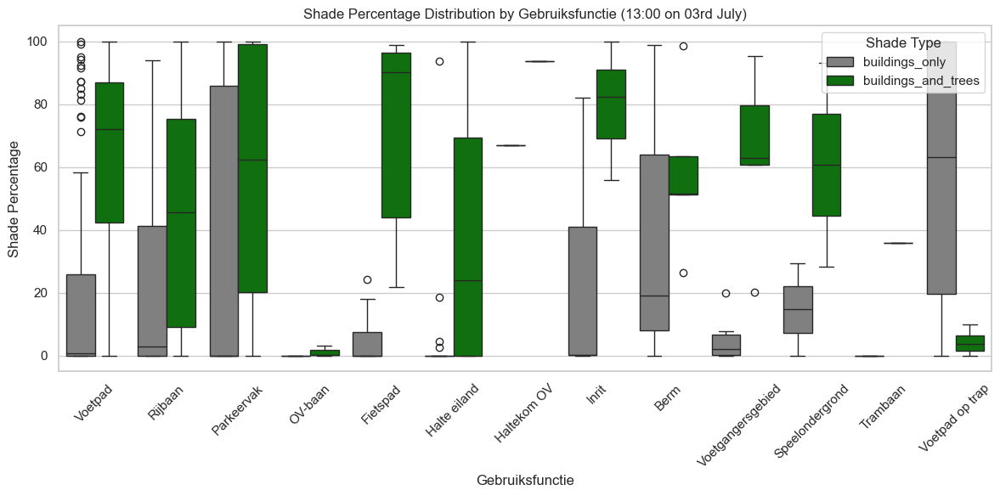

In [266]:
# Convert GeoDataFrame to DataFrame for easier manipulation
df_bldg = pd.DataFrame(coverage_results_buildings_only)

# df_bl;
# merged_bld_trees

df_bldg.rename(columns={"shade_percent":"buildings_only"}, inplace=True)
merged_stats = pd.merge(df, df_bldg, on="Guid", how="left")

# Drop columns with _y suffix
merged_stats = merged_stats.drop(columns=[col for col in merged_stats.columns if col.endswith('_y')])

# Rename columns with _x suffix
merged_stats.columns = [col.replace('_x', '') for col in merged_stats.columns]
merged_stats.rename(columns={"shade_percent":"buildings_and_trees"}, inplace=True)

# Reshape the DataFrame to long format
long_df = pd.melt(merged_stats, id_vars=['Gebruiksfunctie'], 
                  value_vars=['buildings_only', 'buildings_and_trees'], 
                  var_name='shade_type', value_name='percentage')

# Set up the visualizations
sns.set(style="whitegrid")

# Define a custom color palette
custom_palette = {'buildings_only': 'grey', 'buildings_and_trees': 'green'}

# Box plot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Gebruiksfunctie', y='percentage', hue='shade_type', data=long_df, palette=custom_palette)
plt.title('Shade Percentage Distribution by Gebruiksfunctie (13:00 on 03rd July)')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Shade Percentage')
plt.xticks(rotation=45)
plt.legend(title='Shade Type', loc='upper right')
plt.tight_layout()
plt.show()




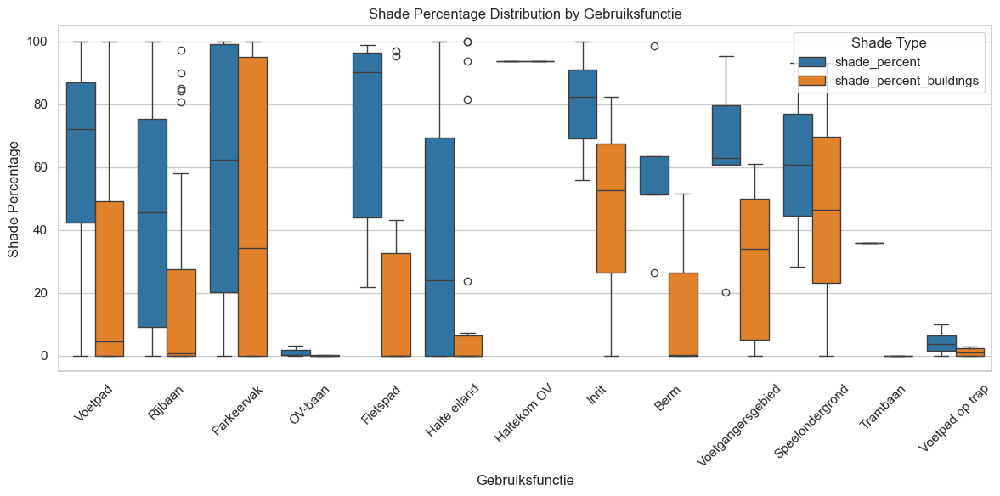

In [248]:
# Reshape the DataFrame to long format
long_df = pd.melt(merged_stats, id_vars=['Gebruiksfunctie'], 
                  value_vars=['shade_percent', 'shade_percent_buildings'], 
                  var_name='shade_type', value_name='percentage')

# Set up the visualizations
sns.set(style="whitegrid")

# Box plot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Gebruiksfunctie', y='percentage', hue='shade_type', data=long_df, palette='tab10')
plt.title('Shade Percentage Distribution by Gebruiksfunctie')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Shade Percentage')
plt.xticks(rotation=45)
plt.legend(title='Shade Type', loc='upper right')
plt.tight_layout()
plt.show()

In [ ]:


# Group by 'Gebruiksfunctie' and calculate summary statistics for 'shade_percent'
summary_stats = merged_stats.groupby('Gebruiksfunctie')['shade_percent'].describe()

# Print summary statistics
print(summary_stats)

# Set up the visualizations
sns.set(style="whitegrid")

# Box plot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Gebruiksfunctie', y='shade_percent', data=df_bldg, palette='tab10')
plt.title('Shade Percentage Distribution by Gebruiksfunctie')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Shade Percentage')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Bar plot of mean shade percentage
mean_shade = df_bldg.groupby('Gebruiksfunctie')['shade_percent'].mean().reset_index()
plt.figure(figsize=(12, 6))
sns.barplot(x='Gebruiksfunctie', y='shade_percent', data=mean_shade, palette='Greens')
plt.title('Mean Shade Percentage by Gebruiksfunctie')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Mean Shade Percentage')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Histogram of shade percentage with legend labels
plt.figure(figsize=(12, 6))
hist_plot = sns.histplot(data=df_bldg, x='shade_percent', hue='Gebruiksfunctie', multiple="stack", palette="tab20", kde=True)
plt.title('Histogram of Shade Percentage by Gebruiksfunctie')
plt.xlabel('Shade Percentage')
plt.ylabel('Frequency')
plt.legend(title='Gebruiksfunctie', labels=hist_plot.get_legend().get_texts())
plt.tight_layout()
plt.show()